In [1]:
# Libraries
import glob
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import histogram_module 
import gauss_module
import dist_module
#import dist_module
from tqdm.notebook import tqdm
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Functions

def rgb2gray(rgb):

    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b

    return gray

'''
def compute_histograms(image_list, hist_type, hist_isgray, num_bins):

    image_hist = []

    # Compute histogram for each image and add it at the bottom of image_hist
    for img in image_list:
        
        # Gray or colored image
        if hist_isgray == True:
            img = rgb2gray(np.array(Image.open(img)))
        else:
            img = np.array(Image.open(img))
        
        # Histogram type
        hist = histogram_module.get_hist_by_name(np.array(img, float), num_bins, hist_type)
        
        # Save results
        image_hist.append(hist)

    return image_hist'''



def single_hist_maker(img, hist_type, hist_isgray, num_bins):
    # Gray or colored image
    if hist_isgray == True:
        img = rgb2gray(np.array(Image.open(img)))
    else:
        img = np.array(Image.open(img))
    # Histogram type
    return histogram_module.get_hist_by_name(np.array(img, float), num_bins, hist_type)



def compute_histograms(image_list, hist_type, hist_isgray, num_bins):

    image_hist = list(map(lambda x: single_hist_maker(x, hist_type, hist_isgray, num_bins), np.array(query)))
    
    return image_hist



def find_best_match(model_images, query_images, dist_type, hist_type, num_bins):

    hist_isgray = histogram_module.is_grayvalue_hist(hist_type)
    
    model_hists = compute_histograms(model_images, hist_type, hist_isgray, num_bins)
    query_hists = compute_histograms(query_images, hist_type, hist_isgray, num_bins)
    
    D = np.zeros((len(model_images), len(query_images)))
        
    best_match = []
    
    for i in range(len(query_hists)):
        Q = query_hists[i]
        dist_list = []
        for j in range(len(model_hists)):
            V = model_hists[j]
            dist = dist_module.get_dist_by_name(Q, V, dist_type)
            D[j, i] = dist
        idx = list(D[:, i]).index(min(D[:, i]))
        best_match.append(idx)

    return best_match, D



def show_neighbors(model_images, query_images, dist_type, hist_type, num_bins):

    plt.figure()
    
    num_nearest = 5  # show the top-5 neighbors
    
    best_match, D = find_best_match(model_images, query_images, dist_type, hist_type, num_bins)
    
    for i in range(len(query_images)):
        closest = sorted(range(len(D[:, i])), key=lambda k: D[:, i][k])[:num_nearest]
        for j in range(1, num_nearest+2):
            plt.figure(num_nearest+1, figsize=(20, 20))
            ax = plt.subplot(1, num_nearest+1, j)
            if j == 1:
                ax.title.set_size(25)
                ax.title.set_text('Q'+str(i))
                plt.axis('off')
                plt.sca(ax)
                plt.imshow(np.array(Image.open(query_images[i])))
            else:
                ax.title.set_size(25)
                ax.title.set_text('M'+str(round(D[closest[j-2], i], 4)))
                plt.axis('off')
                plt.sca(ax)
                plt.imshow(np.array(Image.open(model_images[closest[j-2]])))        
        plt.show()
    return None    

In [3]:
query = glob.glob(".\query\*.png")
model = glob.glob(".\model\*.png")

In [4]:
# Point a)

best_match, D = find_best_match(model, query, 'intersect', 'dxdy', 10)
print(best_match)

[0, 1, 0, 3, 4, 5, 6, 7, 8, 9, 0, 0, 12, 13, 14, 0, 16, 17, 18, 13, 20, 6, 22, 23, 0, 0, 26, 0, 0, 0, 6, 1, 32, 0, 6, 35, 1, 37, 6, 39, 0, 0, 42, 43, 0, 45, 46, 47, 1, 0, 50, 13, 52, 53, 54, 55, 1, 57, 58, 59, 60, 61, 62, 1, 0, 0, 0, 67, 68, 69, 70, 0, 0, 73, 0, 75, 76, 13, 78, 0, 80, 81, 0, 83, 1, 85, 6, 87, 88]


<Figure size 432x288 with 0 Axes>

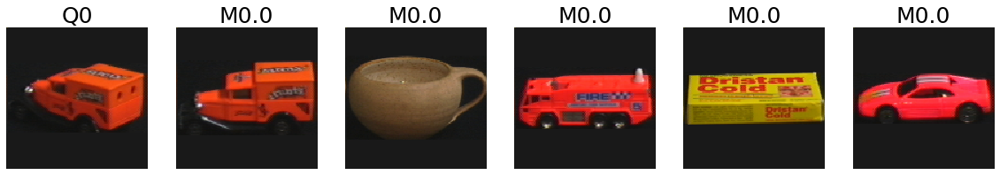

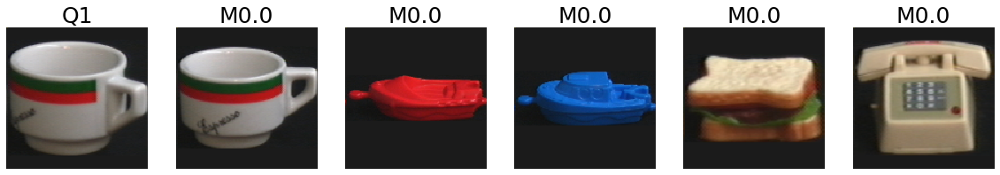

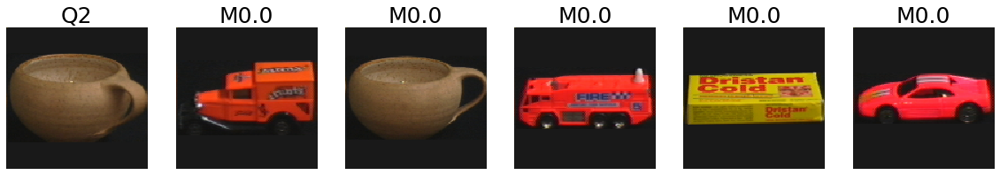

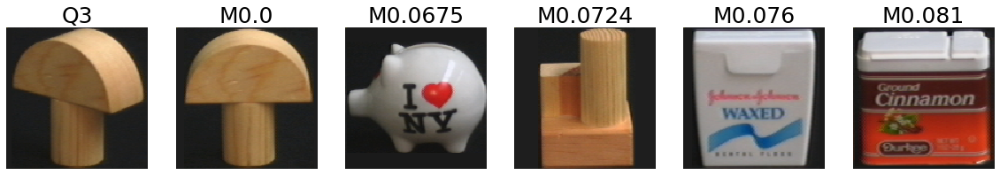

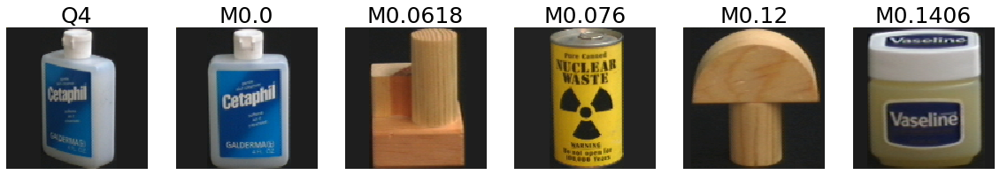

...

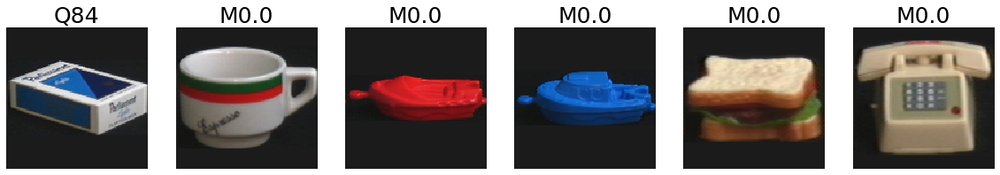

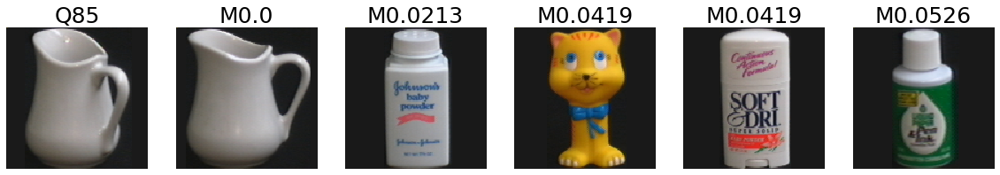

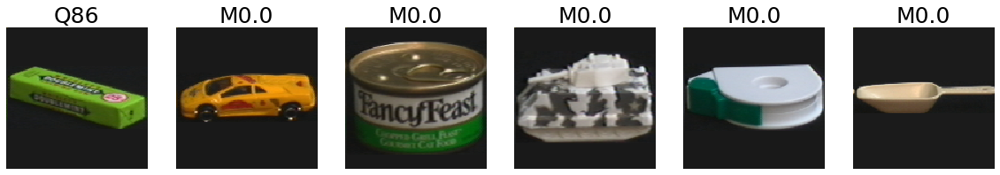

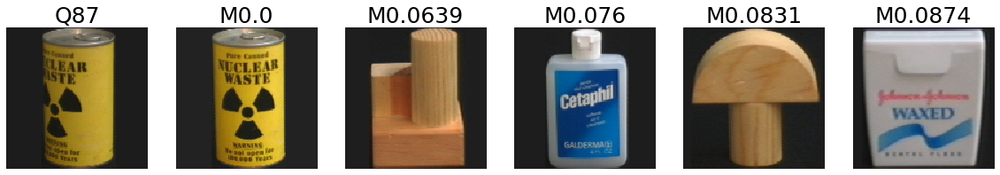

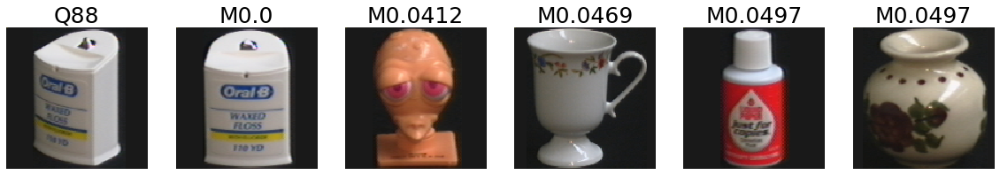

In [5]:
# Point b)

show_neighbors(model, query, 'intersect', 'dxdy', 10)